# Importing packages and Libraries

In [1]:
import os
import json
import pandas as pd
import numpy as np
import pytesseract
import layoutparser as lp
import cv2
from PIL import Image
from pycocotools.coco import COCO
import matplotlib.pyplot as plt

# EDA - layout.json

1. Counting polygons by the number of vertices:
   - The `count_polygons_by_vertices` function takes the JSON data as input.
   - It initializes a dictionary called `counts` to keep track of the count of polygons with different numbers of vertices (1 to 8).
   - It iterates over each annotation in the `data['annotations']` list.
   - For each annotation, it retrieves the `segmentation` field, which contains the coordinates of the polygon vertices.
   - It calculates the number of vertices `n` by dividing the length of the `segmentation` list by 2 (since each vertex has an x and y coordinate).
   - If the number of vertices is between 1 and 8 (inclusive), it increments the corresponding count in the `counts` dictionary.
   - Finally, it prints the count of polygons for each number of vertices (1 to 8).  <br>




2. Checking for invalid polygons:
   - The `is_valid_polygon` function takes a `segmentation` list as input and checks if it represents a valid rectangle.
   - It first checks if all coordinates in the `segmentation` list are non-negative. If any coordinate is negative, it returns `False` along with the reason "Negative coordinates found".
   - It then checks if the coordinates form a valid rectangle by comparing the x and y coordinates of the vertices. If the coordinates do not form a valid rectangle, it returns `False` along with the reason "Coordinates do not form a valid rectangle".
   - If the polygon passes both checks, it returns `True` along with an empty reason string.
   - The `get_category_name` function takes a `category_id` and the JSON data as input and returns the corresponding category name from the `data['categories']` list. If the category is not found, it returns "Unknown".
   - The `check_invalid_polygons` function iterates over each annotation in the `data['annotations']` list.
   - For each annotation, it retrieves the `segmentation` field and checks if it represents a valid polygon using the `is_valid_polygon` function.
   - If the polygon is invalid, it collects the annotation ID, reason for invalidity, segmentation coordinates, image ID, and category name in a list called `invalid_polygons`.
   - Finally, it prints the details of each invalid polygon, including the polygon ID, reason for invalidity, segmentation coordinates, image ID, and category name.

In [4]:
def count_polygons_by_vertices(data):
    # Initialize counters for different values of n
    counts = {1: 0, 2: 0, 3: 0, 4: 0, 5: 0, 6: 0, 7: 0, 8: 0}

    # Iterate over the annotations
    for annotation in data['annotations']:
        segmentation = annotation['segmentation'][0]
        n = len(segmentation) // 2  # Number of vertices
        if 1 <= n <= 8:
            counts[n] += 1

    # Print the counts
    for n in range(1, 9):
        print(f"Number of polygons with {n} vertices: {counts[n]}")

def is_valid_polygon(segmentation):
    # Check if all coordinates are non-negative
    if any(coord < 0 for coord in segmentation):
        return False, "Negative coordinates found"
    
    # Check if the polygon forms a valid rectangle
    x1, y1, x2, y2, x3, y3, x4, y4 = segmentation
    if not (x1 == x4 and x2 == x3 and y1 == y2 and y3 == y4):
        return False, "Coordinates do not form a valid rectangle"
    
    return True, ""

def get_category_name(category_id, data):
    for category in data['categories']:
        if category['id'] == category_id:
            return category['name']
    return "Unknown"

def check_invalid_polygons(data):
    invalid_polygons = []
    for annotation in data['annotations']:
        segmentation = annotation['segmentation'][0]
        is_valid, reason = is_valid_polygon(segmentation)
        if not is_valid:
            image_id = annotation['image_id']
            category_id = annotation['category_id']
            category_name = get_category_name(category_id, data)
            invalid_polygons.append((annotation['id'], reason, segmentation, image_id, category_name))

    # Print the IDs of invalid polygons along with the reason, segmentation, image ID, and category name
    for polygon_id, reason, segmentation, image_id, category_name in invalid_polygons:
        print(f"Polygon ID {polygon_id} is invalid: {reason}. Segments: {segmentation}. Image ID: {image_id}. Category: {category_name}.")

# Load the JSON data
with open('dataset/layout.json', 'r') as f:
    data = json.load(f)

# Count polygons by number of vertices
count_polygons_by_vertices(data)

# Check for invalid polygons
check_invalid_polygons(data)

Number of polygons with 1 vertices: 0
Number of polygons with 2 vertices: 0
Number of polygons with 3 vertices: 0
Number of polygons with 4 vertices: 436
Number of polygons with 5 vertices: 0
Number of polygons with 6 vertices: 0
Number of polygons with 7 vertices: 0
Number of polygons with 8 vertices: 0
Polygon ID 68 is invalid: Negative coordinates found. Segments: [72, -25, 3381, -25, 3381, 466, 72, 466]. Image ID: 2. Category: newspaper_header.
Polygon ID 166 is invalid: Negative coordinates found. Segments: [-4, 15, 3156, 15, 3156, 379, -4, 379]. Image ID: 4. Category: newspaper_header.


## EDA - images
1. **Loading Annotations**:
   - The code reads a JSON file (`layout.json`) that contains information about various elements (annotations) in newspaper images.
   - It extracts the annotations, categories, and image details from this file.

2. **Custom Category Mapping**:
   - A custom class (`CustomCOCO`) is created to map category IDs to their names, making it easier to understand what each annotation represents.

3. **Color Mapping**:
   - A color map is defined to assign specific colors to different types of elements (e.g., headlines are purple, articles are green).

4. **Setting Up the Plot**:
   - A grid of subplots is created using Matplotlib to display multiple images side by side. The grid is set to have 4 rows and 3 columns, with a total size of 24x36 inches.

5. **Processing Each Image**:
   - The code loops through each image in the dataset.
   - For each image, it loads the image file from the specified path.
   - It filters the annotations to get only those that belong to the current image.
   - It creates a layout of text blocks using the annotations, where each block represents an element like a headline or article.

6. **Visualizing the Layout**:
   - The layout is visualized by drawing colored boxes around each text block on the image. The boxes are labeled with the type and ID of the element.
   - The image with the annotated layout is then displayed in one of the subplots.

7. **Displaying the Images**:
   - The images with their annotated layouts are displayed in a grid format, making it easy to see the different elements within each newspaper image.

This code is important for our task of text extraction because it helps us visually verify that the annotations are correct and that each element is properly identified. By analyzing the output, we can ensure that the OCR (Optical Character Recognition) process will accurately extract text from the right regions, such as articles and their corresponding headlines. This visual inspection is crucial for improving the quality and accuracy of the extracted text data.

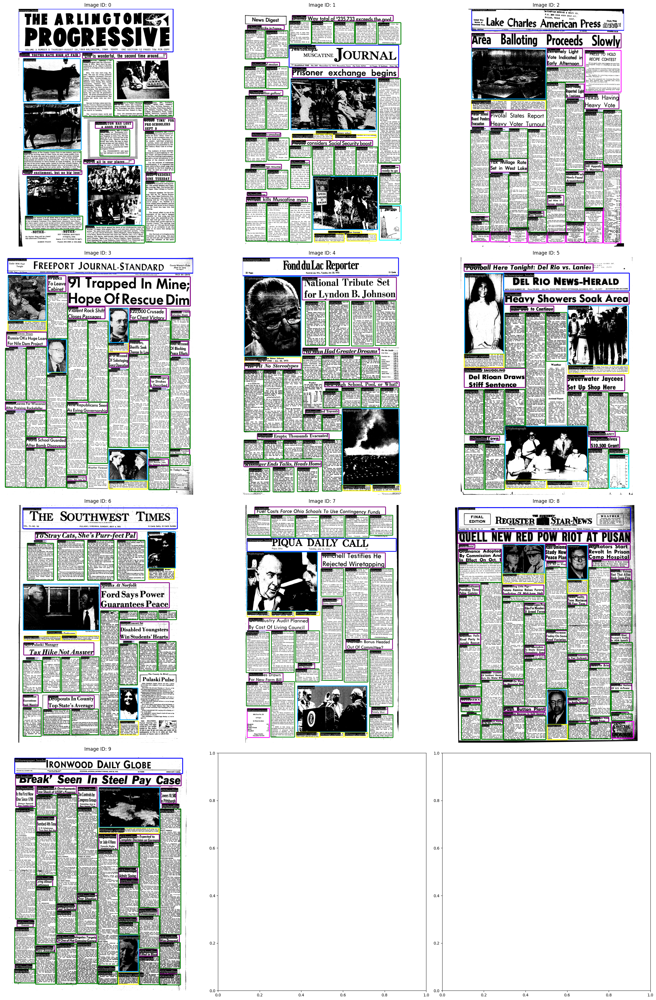

In [3]:
def load_coco_annotations(annotations, coco=None):
    layout = lp.Layout()
    for ele in annotations:
        x, y, w, h = ele['bbox']
        layout.append(
            lp.TextBlock(
                block=lp.Rectangle(x, y, w + x, h + y),
                type=ele['category_id'] if coco is None else coco.cats[ele['category_id']]['name'],
                id=ele['id']
            )
        )
    return layout

# Load the layout.json file
with open('dataset/layout.json', 'r') as f:
    data = json.load(f)

annotations = data['annotations']
categories = {cat['id']: cat['name'] for cat in data['categories']}
images = data['images']

class CustomCOCO:
    def __init__(self, categories):
        self.cats = {cat_id: {'name': name} for cat_id, name in categories.items()}

coco = CustomCOCO(categories)

# Define the color map using the actual category names
color_map = {
    'newspaper_header': 'red',
    'masthead': 'blue',
    'article': 'green',
    'headline': 'purple',
    'author': 'pink',
    'photograph': 'orange',
    'cartoon': 'yellow',
    'image_caption': 'cyan',
    'advertisement': 'magenta',
    'page_number': 'brown',
    'table': 'grey'
}

# Set up the plot with adjusted figure size and spacing
fig, axes = plt.subplots(4, 3, figsize=(24, 36))
fig.subplots_adjust(hspace=0.4, wspace=0.4)
axes = axes.flatten()

# Iterate through all images
for idx, image_info in enumerate(images):
    if idx >= len(axes):
        break  # Ensure we don't exceed the number of subplots

    image_id = image_info['id']
    image_path = f'dataset/images/{image_info["file_name"]}'
    
    # Load the image
    image = cv2.imread(image_path)
    if image is None:
        print(f"Image {image_path} not found.")
        continue

    # Filter annotations for the specific image
    image_annotations = [ann for ann in annotations if ann['image_id'] == image_id]

    # Load the layout
    layout = load_coco_annotations(image_annotations, coco)

    # Visualize the layout with id/type information
    viz = lp.draw_box(image,
                      [b.set(id=f'{b.id}/{b.type}') for b in layout],
                      color_map=color_map,
                      show_element_id=True, id_font_size=50,
                      id_text_background_color='black',
                      id_text_color='white')

    # Convert the PIL image to a format compatible with matplotlib
    viz = np.array(viz)
    viz = cv2.cvtColor(viz, cv2.COLOR_RGB2BGR)

    # Display the image using matplotlib
    axes[idx].imshow(viz)
    axes[idx].set_title(f"Image ID: {image_id}")
    axes[idx].axis('off')

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

# Challenge 1

Code is designed to parse newspaper articles from a dataset of images and their corresponding layout information. The code follows a specific logic to extract the text content of articles, headlines, and their associated metadata. Here's a breakdown of the code's logic and functionality:

## Data Loading

1. The `load_layout_info` function loads the layout information from a JSON file, which contains details about the annotations (bounding boxes, categories, etc.) and reading orders for the newspaper images.

## Image Preprocessing

2. The `preprocess_image` function takes a PIL image as input and applies preprocessing steps to enhance the image quality and reduce noise. It converts the image to grayscale, applies binary thresholding using Otsu's method, and returns the preprocessed image.

## Optical Character Recognition (OCR)

3. The `perform_ocr` function performs OCR on a specific region of an image defined by a bounding box (`bbox`). It crops the image based on the provided bounding box coordinates, preprocesses the cropped image, and then uses Tesseract OCR engine to extract the text from the preprocessed image. The function handles potential errors related to invalid bounding box coordinates.

## Article Parsing

4. The `parse_articles` function is the core logic for parsing articles from a single newspaper image. It takes the image path and the layout information as input. Here's how it works:
   - It processes the reading order information to build a dictionary for forward and reverse lookup of reading orders.
   - It identifies the starting points for articles, which can be headlines or text blocks without a predecessor in the reading order.
   - For each starting point, it follows the reading order to concatenate the text content of article blocks and headlines.
   - It creates an article entry containing the headline, article text, image ID, and annotation IDs for each successfully parsed article.

## Newspaper Processing

5. The `process_newspapers` function orchestrates the parsing of articles across all newspaper images in the dataset. It iterates over each image, filters the layout annotations for the current image, and calls the `parse_articles` function to extract articles. The parsed articles are accumulated into a list.

## Main Execution

6. The code specifies the paths to the images directory and the layout JSON file.
7. It calls the `process_newspapers` function to parse articles from all newspaper images in the dataset.
8. The parsed articles are stored in a pandas DataFrame, with each row representing an article and columns for the article's ID, headline, text, image ID, and annotation IDs.
9. The DataFrame is displayed, with the 'id' column containing unique IDs assigned to each article.

In [8]:
import os
import json
import cv2
import pytesseract
import layoutparser as lp
from PIL import Image
import numpy as np
import pandas as pd

def load_layout_info(layout_json_path):
    with open(layout_json_path) as f:
        layout_info = json.load(f)
    return layout_info

def preprocess_image(image):
    """
    Preprocess the image to enhance quality and reduce noise.
    
    Args:
        image (PIL.Image): The image to preprocess.
    
    Returns:
        PIL.Image: The preprocessed image.
    """
    # Convert PIL image to OpenCV format
    image_cv = cv2.cvtColor(np.array(image), cv2.COLOR_RGB2BGR)
    
    # Convert to grayscale
    gray = cv2.cvtColor(image_cv, cv2.COLOR_BGR2GRAY)
    
    # Apply binary thresholding
    _, binary = cv2.threshold(gray, 128, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
    
    # Convert back to PIL format
    preprocessed_image = Image.fromarray(binary)
    
    return preprocessed_image

def perform_ocr(image_path, bbox, annotation_id, image_id, category_id):
    try:
        image = Image.open(image_path)
        # Convert bbox from [x_min, y_min, width, height] to [left, upper, right, lower]
        left, upper, width, height = bbox
        right = left + width
        lower = upper + height
        crop_box = (left, upper, right, lower)
        
        # Ensure the coordinates are valid for cropping
        if right <= left or lower <= upper:
            raise ValueError("Invalid bbox coordinates for cropping.")
        
        cropped_image = image.crop(crop_box)
        
        # Preprocess the cropped image
        preprocessed_image = preprocess_image(cropped_image)
        
        # Perform OCR on the preprocessed image
        custom_config = r'--oem 3 --psm 6'
        text = pytesseract.image_to_string(preprocessed_image, config=custom_config)
        return text.strip()
    except ValueError as e:
        print(f"Skipping annotation ID {annotation_id} for image ID {image_id} with category ID {category_id} due to error: {e}")
        print(f"Problematic bbox: {bbox}")
        return None  # Return None to indicate the error


def parse_articles(image_path, layout_info):
    articles = []
    reading_orders = layout_info.get('reading_orders', [])
    reading_order_dict = {ro['from_id']: ro['to_id'] for ro in reading_orders}
    
    # Create a reverse lookup for reading orders to find starting points (headlines)
    reverse_reading_order_dict = {}
    for ro in reading_orders:
        reverse_reading_order_dict.setdefault(ro['to_id'], []).append(ro['from_id'])
    
    # Find starting points for articles (headlines or first text block without a predecessor)
    starting_points = set()
    for annotation in layout_info['annotations']:
        if annotation['category_id'] == 2 or annotation['category_id'] == 3:  # Article or headline
            if annotation['id'] not in reverse_reading_order_dict:
                starting_points.add(annotation['id'])
    
    # Process each starting point to build articles
    for start_id in starting_points:
        current_id = start_id
        article_text = []
        anno_ids = []
        headlines = []
        image_id = None
        
        # Follow the reading order to concatenate text
        while current_id is not None:
            for annotation in layout_info['annotations']:
                if annotation['id'] == current_id:
                    image_id = annotation['image_id']  # All blocks of an article share the same image_id
                    if annotation['category_id'] == 2:  # Article text
                        text = perform_ocr(image_path, annotation['bbox'], annotation['id'], image_id, annotation['category_id'])
                        if text:
                            article_text.append(text)
                            anno_ids.append(annotation['id'])
                    elif annotation['category_id'] == 3:  # Headline
                        headline = perform_ocr(image_path, annotation['bbox'], annotation['id'], image_id, annotation['category_id'])
                        if headline:
                            headlines.append(headline)
                    break
            current_id = reading_order_dict.get(current_id)
        
        # Create article entry if there is at least one article text block
        if article_text:
            articles.append({
                'headline': ' '.join(headlines),  # Join the headlines into a single string
                'text': ' '.join(article_text),
                'image_id': image_id,
                'anno_ids': anno_ids
            })
    
    return articles


def process_newspapers(images_dir, layout_json_path):
    layout_info = load_layout_info(layout_json_path)
    all_articles = []

    for image_info in layout_info['images']:
        image_path = os.path.join(images_dir, image_info['file_name'])
        image_id = image_info['id']

        # Filter the annotations for the current image_id
        layout_annotations = [anno for anno in layout_info['annotations'] if anno['image_id'] == image_id]

        # Process the current image to parse articles
        parsed_articles = parse_articles(image_path, {'annotations': layout_annotations, 'reading_orders': layout_info['reading_orders']})
        all_articles.extend(parsed_articles)

    return all_articles

# Specify the paths to the images directory and layout JSON file
images_dir = 'dataset/images'
layout_json_path = 'dataset/layout.json'

# Process all the newspapers and parse articles
parsed_articles = process_newspapers(images_dir, layout_json_path)

# Display the parsed articles as a pandas DataFrame
article_df = pd.DataFrame(parsed_articles)

# Assign unique IDs to the 'id' column
article_df['id'] = range(0, len(article_df))

# Reorder the columns to have 'id' at the start
article_df = article_df[['id'] + [col for col in article_df.columns if col != 'id']]

In [9]:
article_df

,id,headline,text,image_id,anno_ids
0,0,AREA YOUTHS RATE HIGH AT FAIR,The 1969 edition of The Fayette County Fair is...,0,[4]
1,1,"‘Some excitement, but no big loss!’",Gary Manson seems to be all alone when a small...,0,[7]
2,2,"‘Life is wonderful, the second time around....!’","ARLINGTON (Special) - On\nSunday, August 24th ...",0,"[9, 10, 11]"
3,3,ARLINGTON HAS LOST\nA GOOD FRIEND,"Nettie Perkins, age 73 years\npassed away on W...",0,[13]
4,4,“We're all in our places....!”,"When Mrs, Sandy Quick opened the doors of her ...",0,[16]
...,...,...,...,...,...
114,114,Says Barracks\n‘Unnecessary’,-WASHINGTON @ — A house\nwatchdog committee. r...,9,[426]
115,115,4 Coal Miners\nKilled in Blast,"LANSFORD, Pa. (#—Four min-\ners were killed an...",9,[427]
116,116,"interim Pact:\nCovers 10,500\nin Pittsburgh Mu...",PITISBURGH — The CIO\nUnited Steelworkers hav...,9,[431]
117,117,Thought Man —\nWas Drowned |,"STEVENS POINT, Wis. —-A\nman thought to have d...",9,[433]


In [30]:
article_df.to_json("part1_final.json", orient='records', indent=2)

In [10]:
missing_text_rows = article_df[article_df['text'] == '']
print(missing_text_rows)

Empty DataFrame
Columns: [id, headline, text, image_id, anno_ids]
Index: []


In [11]:
missing_headline_rows = article_df[article_df['headline'] == '']

In [12]:
missing_headline_rows

,id,headline,text,image_id,anno_ids
28,28,,| WEST LAKE — ‘Taxes totaling\n22% mills were ...,2,[91]
29,29,,traffic light at the intersection of\nSulphur ...,2,[92]
31,31,,} ASSVUCIaGICd ress ocience writer\n| SAN FRAN...,3,[135]
33,33,,A crusade to turn out a victory\nreport for th...,3,[139]
35,35,,"SPRINGHILL, N.S. (AP) — ¢\nViolent shift of ro...",3,[148]
36,36,,MMS RU oat Che OUMp\nthe miners’ name for unde...,3,[152]
98,98,,WASHINGTON — The -natior\ntoday has its first...,9,[384]


In [13]:
article_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119 entries, 0 to 118
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   id        119 non-null    int64 
 1   headline  119 non-null    object
 2   text      119 non-null    object
 3   image_id  119 non-null    int64 
 4   anno_ids  119 non-null    object
dtypes: int64(2), object(3)
memory usage: 4.8+ KB


# Manually checking for articles with missing headlines to understand the issue behind it

The code is used to extract headline text from a specific newspaper image using the layout information (annotations and reading orders) from a JSON file. It iterates over the annotations of a particular image, identifies the headlines (category_id=3), extracts the text using OCR, and prints the annotation details along with the extracted headline text and the associated reading order information.

In [14]:
with open('dataset/layout.json', 'r') as file:
    data = json.load(file)

image_id = 2
annotations = [ann for ann in data['annotations'] if ann['image_id'] == image_id]

annotations.sort(key=lambda x: (x['bbox'][1], x['bbox'][0]))

image_path = 'dataset/images/116879284-lake-charles-american-press-Nov-06-1962-p-1.jpg'  
image = cv2.imread(image_path)


def extract_headline_text(image, bbox):
    x, y, w, h = bbox
    roi = image[y:y+h, x:x+w]
    return pytesseract.image_to_string(roi).strip()

for ann in annotations:
    if ann['category_id'] == 3: 
        headline_text = extract_headline_text(image, ann['bbox'])
        reading_order = [[rel['from_id'], rel['to_id']] for rel in data.get('reading_orders', []) if (ann['id'] == rel['from_id'] or ann['id'] == rel['to_id']) and rel['image_id'] == image_id]
        print(f"Annotation ID: {ann['id']}, BBox: {ann['bbox']}, Headline Text: {headline_text}, Reading Order: {reading_order}")
        print("==========================================================================")

Annotation ID: 69, BBox: [71, 529, 3247, 320], Headline Text: Area Balloting Proceeds Slowly, Reading Order: [[69, 70]]
Annotation ID: 72, BBox: [1710, 862, 768, 377], Headline Text: Extremely Light
Vote Indicated in
Early Afternoon, Reading Order: [[72, 101]]
Annotation ID: 76, BBox: [2114, 1632, 401, 293], Headline Text: Early Voting
Reported Light
In Louisiana, Reading Order: [[76, 106]]
Annotation ID: 77, BBox: [2525, 1846, 746, 325], Headline Text: Texas Having
Heavy Vote, Reading Order: [[77, 110]]
Annotation ID: 75, BBox: [481, 2201, 1219, 358], Headline Text: Pivotal States Report
Heavy Voter Turnout, Reading Order: [[75, 108]]
Annotation ID: 74, BBox: [61, 2218, 399, 338], Headline Text: Parish School
Board Ponders
Evacuation, Reading Order: [[74, 107]]
Annotation ID: 84, BBox: [469, 3253, 811, 294], Headline Text: Tax Millage Rate
Set in West Lake, Reading Order: []
Annotation ID: 89, BBox: [2525, 3312, 384, 219], Headline Text: Governorship
Still Appeals
To Morrison, Reading

In [15]:
with open('dataset/layout.json', 'r') as file:
    data = json.load(file)

image_id = 3
annotations = [ann for ann in data['annotations'] if ann['image_id'] == image_id]

annotations.sort(key=lambda x: (x['bbox'][1], x['bbox'][0]))

image_path = 'dataset/images/164811516-freeport-journal-standard-Oct-24-1958-p-1.jpg'  
image = cv2.imread(image_path)

def extract_headline_text(image, bbox):
    x, y, w, h = bbox
    roi = image[y:y+h, x:x+w]
    return pytesseract.image_to_string(roi).strip()



for ann in annotations:
    if ann['category_id'] == 3: 
        headline_text = extract_headline_text(image, ann['bbox'])
        reading_order = [[rel['from_id'], rel['to_id']] for rel in data.get('reading_orders', []) if (ann['id'] == rel['from_id'] or ann['id'] == rel['to_id']) and rel['image_id'] == image_id]
        print(f"Annotation ID: {ann['id']}, BBox: {ann['bbox']}, Headline Text: {headline_text}, Reading Order: {reading_order}")
        print("==========================================================================")

Annotation ID: 126, BBox: [1314, 542, 530, 468], Headline Text: Weeks
To Leave
Cabinet, Reading Order: [[126, 147]]
Annotation ID: 156, BBox: [1903, 572, 3573, 859], Headline Text: , Reading Order: []
Annotation ID: 119, BBox: [1895, 1456, 1090, 346], Headline Text: Violent Rock Shift

Closes Passages, Reading Order: []
Annotation ID: 122, BBox: [3713, 1493, 1060, 345], Headline Text: $20,000 Crusade
For Chest Victory, Reading Order: []
Annotation ID: 138, BBox: [4915, 1575, 551, 159], Headline Text: Turn Back Clocks
Saturday Night, Reading Order: [[138, 141]]
Annotation ID: 118, BBox: [110, 2190, 1178, 412], Headline Text: Nasser Achieves Dream.
Russia OKs Huge Loan
For Nile Dam Project, Reading Order: [[118, 160]]
Annotation ID: 125, BBox: [3695, 2433, 572, 403], Headline Text: Treasurers,
Sheriffs Seek
Change In Law, Reading Order: [[125, 128]]
Annotation ID: 120, BBox: [4883, 2459, 549, 410], Headline Text: Reds Accused
Of Blocking
Peace Efforts, Reading Order: [[120, 159]]
Annotat

In [16]:
with open('dataset/layout.json', 'r') as file:
    data = json.load(file)

image_id = 9
annotations = [ann for ann in data['annotations'] if ann['image_id'] == image_id]

annotations.sort(key=lambda x: (x['bbox'][1], x['bbox'][0]))

image_path = 'dataset/images/138775453-ironwood-daily-globe-Jun-28-1952-p-1.jpg'  
image = cv2.imread(image_path)


def extract_headline_text(image, bbox):
    x, y, w, h = bbox
    roi = image[y:y+h, x:x+w]
    return pytesseract.image_to_string(roi).strip()

for ann in annotations:
    if ann['category_id'] == 3: 
        headline_text = extract_headline_text(image, ann['bbox'])
        reading_order = [[rel['from_id'], rel['to_id']] for rel in data.get('reading_orders', []) if (ann['id'] == rel['from_id'] or ann['id'] == rel['to_id']) and rel['image_id'] == image_id]
        print(f"Annotation ID: {ann['id']}, BBox: {ann['bbox']}, Headline Text: {headline_text}, Reading Order: {reading_order}")
        print("==========================================================================")

Annotation ID: 381, BBox: [113, 385, 2956, 200], Headline Text: ‘Break’ Seen In Steel Pay Case, Reading Order: []
Annotation ID: 382, BBox: [118, 590, 350, 367], Headline Text: Immigration Act
Is the First New
One Since 1798

Measure Approved
Over Truman Veto, Reading Order: []
Annotation ID: 389, BBox: [492, 592, 706, 135], Headline Text: Hints of New A-Developments
Ease Shock of USSR’s Progress, Reading Order: [[389, 390]]
Annotation ID: 405, BBox: [1228, 609, 341, 360], Headline Text: Extension Voted
On Controls by
Congress Group

Committee Acts in
Race Against Time, Reading Order: [[405, 406]]
Annotation ID: 429, BBox: [2707, 626, 273, 273], Headline Text: interim Pact:
Covers 10,500
in Pittsburgh, Reading Order: [[429, 430]]
Annotation ID: 430, BBox: [2728, 908, 288, 88], Headline Text: Murray Personally
Negotiates Signing, Reading Order: [[429, 430], [430, 431]]
Annotation ID: 393, BBox: [494, 1133, 347, 269], Headline Text: Flectric Plants
Bombed 4th Time

U. N. Infantrymen
Thro

In [17]:
df = article_df.copy()

# Manually correcting the dataset, now every article has a headline

We update the headlines and concatenating text for specific articles in a pandas DataFrame based on the information provided in an updates dictionary, which is formed manually after verifying and analysing output of the previous code. It iterates over the updates, modifies the 'headline' and 'text' columns accordingly, drops the rows that were concatenated, resets the index, and assigns new IDs to the remaining rows

In [18]:
updates = {
    2: [
        {'id': 28, 'headline': 'Tax Millage Rate Set in West Lake', 'text_id_to_concat': 29}
    ],
    3: [
        {'id': 31, 'headline': 'New Surgery For Strokes is Described'},
        {'id': 33, 'headline': '$20,000 Crusade For Chest Victory'},
        {'id': 35, 'headline': 'Violent Rock Shift Closes Passages', 'text_id_to_concat': 36}
    ],
    9: [
        {'id': 98, 'headline': 'Immigration Act Is the First New One Since 1798 Measure Approved'}
    ]
}

# Update DataFrame based on updates dictionary
rows_to_drop = []
for image_id, updates_list in updates.items():
    for update in updates_list:
        if 'text_id_to_concat' in update:
            # Concatenate text from another row
            df.loc[update['id'], 'text'] += ' ' + df.loc[update['text_id_to_concat'], 'text']
            rows_to_drop.append(update['text_id_to_concat'])
        # Update headline
        df.loc[update['id'], 'headline'] = update['headline']

# Drop concatenated rows
df = df.drop(rows_to_drop)

# Reset index and re-assign IDs
df = df.reset_index(drop=True)
df['id'] = df.index 

In [19]:
df

,id,headline,text,image_id,anno_ids
0,0,AREA YOUTHS RATE HIGH AT FAIR,The 1969 edition of The Fayette County Fair is...,0,[4]
1,1,"‘Some excitement, but no big loss!’",Gary Manson seems to be all alone when a small...,0,[7]
2,2,"‘Life is wonderful, the second time around....!’","ARLINGTON (Special) - On\nSunday, August 24th ...",0,"[9, 10, 11]"
3,3,ARLINGTON HAS LOST\nA GOOD FRIEND,"Nettie Perkins, age 73 years\npassed away on W...",0,[13]
4,4,“We're all in our places....!”,"When Mrs, Sandy Quick opened the doors of her ...",0,[16]
...,...,...,...,...,...
112,112,Says Barracks\n‘Unnecessary’,-WASHINGTON @ — A house\nwatchdog committee. r...,9,[426]
113,113,4 Coal Miners\nKilled in Blast,"LANSFORD, Pa. (#—Four min-\ners were killed an...",9,[427]
114,114,"interim Pact:\nCovers 10,500\nin Pittsburgh Mu...",PITISBURGH — The CIO\nUnited Steelworkers hav...,9,[431]
115,115,Thought Man —\nWas Drowned |,"STEVENS POINT, Wis. —-A\nman thought to have d...",9,[433]


In [20]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 117 entries, 0 to 116
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   id        117 non-null    int64 
 1   headline  117 non-null    object
 2   text      117 non-null    object
 3   image_id  117 non-null    int64 
 4   anno_ids  117 non-null    object
dtypes: int64(2), object(3)
memory usage: 4.7+ KB


In [21]:
missing_text_rows = df[df['text'] == '']
print("Texts missing :", missing_text_rows)
print("===========================================")
missing_headline_rows = df[df['headline'] == '']
print("Headlines missing :", missing_headline_rows)

Texts missing : Empty DataFrame
Columns: [id, headline, text, image_id, anno_ids]
Index: []
Headlines missing : Empty DataFrame
Columns: [id, headline, text, image_id, anno_ids]
Index: []


In [24]:
df

,id,headline,text,image_id,anno_ids
0,0,AREA YOUTHS RATE HIGH AT FAIR,The 1969 edition of The Fayette County Fair is...,0,[4]
1,1,"‘Some excitement, but no big loss!’",Gary Manson seems to be all alone when a small...,0,[7]
2,2,"‘Life is wonderful, the second time around....!’","ARLINGTON (Special) - On\nSunday, August 24th ...",0,"[9, 10, 11]"
3,3,ARLINGTON HAS LOST\nA GOOD FRIEND,"Nettie Perkins, age 73 years\npassed away on W...",0,[13]
4,4,“We're all in our places....!”,"When Mrs, Sandy Quick opened the doors of her ...",0,[16]
...,...,...,...,...,...
112,112,Says Barracks\n‘Unnecessary’,-WASHINGTON @ — A house\nwatchdog committee. r...,9,[426]
113,113,4 Coal Miners\nKilled in Blast,"LANSFORD, Pa. (#—Four min-\ners were killed an...",9,[427]
114,114,"interim Pact:\nCovers 10,500\nin Pittsburgh Mu...",PITISBURGH — The CIO\nUnited Steelworkers hav...,9,[431]
115,115,Thought Man —\nWas Drowned |,"STEVENS POINT, Wis. —-A\nman thought to have d...",9,[433]


In [28]:
df.to_json("final_final.json", orient='records', indent=2)